# CUDA LAB - Generative Adversarial Networks

## Required Libraries

In [1]:
import os
import shutil
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import datasets, models, transforms
from torchvision.utils import save_image
from torch.utils.tensorboard import SummaryWriter

## Observations:
### 1) Latent spaces of size 10,100,150,200,1000 and 3000 were explored however, they did not seem to change the outcome much. The model just took longer in the beginning to start giving some shapes and color to the generated images as the latent size was increased.
### 2) Latent spaces of size 100 was the most experimented upon with changing layers in conv2d and convtranspose2d. However, the most influencial parameter was the feature maps i.e. in_channels and out_channels.
### 3) Below you will see "ngf" and "ndf" parameters controlling the feature maps. When they were set to low as 16 or 24, the images generated were not as nice as generated when it was increased to 32 or 64 which I thought seemed obsvious as we now have more parameters to learn however, the model became too slow.
### 4) One of the model was running for 500+ epochs on google collab and it started to generate a lot nicer images but google collab disconnected at some point and we only have some downloaded images to show for that particular model. Rest of the models have images and logs saved.
### 5) The models were quick to learn about different colors and shapes however, even after numerous epochs, the images generated had features from different labels. Like, a mixture of animals and something with vehicles. One model started to generate images that looked like an airplane, car, especially frog and some understanding of water surrounding an object which we hope is a ship :)

In [3]:
TBOARD_LOGS = os.path.join(os.getcwd(), "tboard_logs", "test")
if not os.path.exists(TBOARD_LOGS):
    os.makedirs(TBOARD_LOGS)

In [4]:
print(TBOARD_LOGS)

C:\Users\Pahul\Downloads\Coding\Cuda lab\tboard_logs\test


In [5]:
shutil.rmtree(TBOARD_LOGS)

writer = SummaryWriter(TBOARD_LOGS)

In [6]:
print(writer)

## Sample for testing how the tensorboard looks like

In [7]:
randoms = []
for i in range(int(1e4)):
    log = np.log10(i+1)
    random = np.random.randn()
    randoms.append(random)
    uniform = np.random.rand() * 2 - 1
    
    writer.add_scalar(f'Log Number', log, global_step=i)
    writer.add_scalars(f'Random Stuff', {
                'Gaussian': random,
                'Uniform': uniform
            }, i)
    
    if(i % 1000 == 0):
        # adding random figures
        imgs = torch.randn(16,1,16,16)
        grid = torchvision.utils.make_grid(imgs)
        writer.add_image('images', grid, global_step=i)
        
        # adding distribution
        writer.add_histogram("Sampled Gaussian", np.array(randoms), global_step=i)

## Now making doirectories for GAN logs (Both images and losses on tensorboard)

In [8]:
GAN_LOGS = os.path.join(os.getcwd(), "tboard_logs", "gan")
if not os.path.exists(GAN_LOGS):
    os.makedirs(GAN_LOGS)

In [9]:
shutil.rmtree(GAN_LOGS)
writer = SummaryWriter(GAN_LOGS)

In [10]:
if not os.path.exists("imgs"):
    os.makedirs("imgs")

In [11]:
if not os.path.exists("imgs/training"):
    os.makedirs("imgs/training")

## CIFAR10 Dataset Used

In [12]:
# Downloading and Loading Dataset
mnist_tf = transforms.Compose([
        transforms.ToTensor(),
        #transforms.Pad(2)
    ])

train_dataset = datasets.CIFAR10(root='./data', train=True, transform=mnist_tf,download=True)
#test_dataset = datasets.CIFAR10(root='./data', train=False, transform=mnist_tf,download=True)

Files already downloaded and verified


# Parameters

In [22]:
b_size = 128
image_size = 64
# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 32

# Size of feature maps in discriminator
ndf = 32

# Number of training epochs
num_epochs = 25

# Learning rate for optimizers
lr = 0.0003

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [23]:
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=b_size, shuffle=True) 

In [24]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [25]:
class Generator(nn.Module):
    """
    A fully connected generator using LeakyReLU activations. 
    Takes as a latent vector and outputs a fake sample.
    """
    def __init__(self):
        """ Model initializer """
        super().__init__()
        self.gen = nn.Sequential(
            nn.ConvTranspose2d( nz, ngf * 16, 2, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 16),
            nn.LeakyReLU(0.2),
            # state size. (ngf*16) x 2 x 2
            nn.ConvTranspose2d(ngf * 16, ngf * 8, 3, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.LeakyReLU(0.2),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.LeakyReLU(0.2),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.LeakyReLU(0.2),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.LeakyReLU(0.2),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 1, 1, 0, bias=False),
            # state size. (nc) x 32 x 32
            nn.Tanh()
        )
        return
    
    def forward(self, x):
        """ Forward pass through generator """
        y = self.gen(x)
        return y

In [26]:
class Discriminator(nn.Module):
    """ A fully connected discriminator using LeakyReLU activations. 
    Takes as input either a real or fake sample and predicts its autenticity.
    """
    def __init__(self):
        """ Module initializer """
        super().__init__()  
        self.dis = nn.Sequential(
            nn.Conv2d(nc, ndf, 1, 1, 0, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
        return
      
    def forward(self, x):
        """ Forward pass """
        y = self.dis(x)
        return y

In [27]:
generator = Generator()
print(generator)

Generator(
  (gen): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(2, 2), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): ConvTranspose2d(512, 256, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2)
    (12): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=Fa

In [32]:
discriminator = Discriminator()
print(discriminator)

Discriminator(
  (dis): Sequential(
    (0): Conv2d(3, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [33]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

In [34]:
netG = Generator().to(device)
netG.apply(weights_init)
print(netG)

Generator(
  (gen): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(2, 2), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): ConvTranspose2d(512, 256, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2)
    (12): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=Fa

In [35]:
netD = Discriminator().to(device)
netD.apply(weights_init)
print(netD)

Discriminator(
  (dis): Sequential(
    (0): Conv2d(3, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


### Instead of the helper function from session 7, the helper function was used from https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html 

### Changes made: Code for writing to tensorboard was added and the code mentioned in the link was not using optimizerG.zero_grad() and optimizerD.zero_grad() but still they claimed good results. Also LeakyReLU was used instead of ReLU in conv layers. The conv layers parameters kernel size, stride and padding were changed as well. Different number of layers were experimented upon with changing the features channels. 

In [36]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.
import torch.optim as optim
# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [37]:
import torchvision.utils as vutils

In [38]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0


print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(train_loader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        optimizerG.zero_grad()
        optimizerD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        #optimizerD.step() #change
        
        #============change===============
        #optimizerD.zero_grad()#change
        # optimization step
        torch.nn.utils.clip_grad_norm_(netD.parameters(), 3.0)
        optimizerD.step()
        #=================================
        
        
        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        #optimizerG.zero_grad() #change
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        
        #================change=============
        writer.add_scalar(f'Loss/Discriminator Loss', errD.item(), global_step=iters)
        writer.add_scalar(f'Loss/Generator Loss', errG.item(), global_step=iters)
        writer.add_scalars(f'Comb_Loss/Losses', {
                            'Discriminator': errD.item(),
                            'Generator':  errG.item()
                        }, iters) 
        
        #=============================
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        #==================change==============
        if(iters % 500 == 0):
            #imgs = self.generate()
            with torch.no_grad():
                imgs = netG(fixed_noise).detach().cpu()
            grid = torchvision.utils.make_grid(imgs, nrow=8)
            writer.add_image('images', grid, global_step=iters)
            torchvision.utils.save_image(grid, os.path.join(os.getcwd(), "imgs", "training", f"imgs_{iters}.png"))
        #=================================
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/25][0/391]	Loss_D: 1.7983	Loss_G: 3.8897	D(x): 0.5513	D(G(z)): 0.6471 / 0.0294
[0/25][50/391]	Loss_D: 0.0886	Loss_G: 13.3394	D(x): 0.9980	D(G(z)): 0.0826 / 0.0000
[0/25][100/391]	Loss_D: 0.4823	Loss_G: 5.0414	D(x): 0.7793	D(G(z)): 0.0706 / 0.0381
[0/25][150/391]	Loss_D: 1.1132	Loss_G: 3.6986	D(x): 0.4785	D(G(z)): 0.0224 / 0.0296
[0/25][200/391]	Loss_D: 0.5055	Loss_G: 5.0389	D(x): 0.9709	D(G(z)): 0.3492 / 0.0079
[0/25][250/391]	Loss_D: 1.4175	Loss_G: 2.6146	D(x): 0.4922	D(G(z)): 0.0899 / 0.1588
[0/25][300/391]	Loss_D: 0.2908	Loss_G: 7.5466	D(x): 0.9538	D(G(z)): 0.1705 / 0.0018
[0/25][350/391]	Loss_D: 0.1284	Loss_G: 8.4618	D(x): 0.9771	D(G(z)): 0.0879 / 0.0004
[1/25][0/391]	Loss_D: 0.6401	Loss_G: 4.2917	D(x): 0.9807	D(G(z)): 0.4288 / 0.0299
[1/25][50/391]	Loss_D: 0.9163	Loss_G: 3.6689	D(x): 0.6259	D(G(z)): 0.1310 / 0.0531
[1/25][100/391]	Loss_D: 0.2010	Loss_G: 3.3443	D(x): 0.8777	D(G(z)): 0.0361 / 0.0618
[1/25][150/391]	Loss_D: 1.1222	Loss_G: 4.3610	D(x): 0.4

[12/25][100/391]	Loss_D: 1.2572	Loss_G: 3.2575	D(x): 0.3789	D(G(z)): 0.0213 / 0.0591
[12/25][150/391]	Loss_D: 0.3368	Loss_G: 4.4227	D(x): 0.8767	D(G(z)): 0.1636 / 0.0199
[12/25][200/391]	Loss_D: 0.6468	Loss_G: 2.2196	D(x): 0.6249	D(G(z)): 0.0667 / 0.1530
[12/25][250/391]	Loss_D: 0.8784	Loss_G: 4.4701	D(x): 0.9581	D(G(z)): 0.5019 / 0.0185
[12/25][300/391]	Loss_D: 0.4623	Loss_G: 2.3162	D(x): 0.7541	D(G(z)): 0.1070 / 0.1461
[12/25][350/391]	Loss_D: 0.6957	Loss_G: 0.5763	D(x): 0.6132	D(G(z)): 0.0695 / 0.6125
[13/25][0/391]	Loss_D: 0.6626	Loss_G: 1.8237	D(x): 0.6792	D(G(z)): 0.1234 / 0.2622
[13/25][50/391]	Loss_D: 0.2797	Loss_G: 4.1523	D(x): 0.9043	D(G(z)): 0.1381 / 0.0293
[13/25][100/391]	Loss_D: 0.3521	Loss_G: 4.4929	D(x): 0.7411	D(G(z)): 0.0136 / 0.0206
[13/25][150/391]	Loss_D: 0.4574	Loss_G: 6.9689	D(x): 0.9538	D(G(z)): 0.2773 / 0.0018
[13/25][200/391]	Loss_D: 0.6826	Loss_G: 3.5669	D(x): 0.7504	D(G(z)): 0.2301 / 0.0535
[13/25][250/391]	Loss_D: 0.5768	Loss_G: 5.8378	D(x): 0.8813	D(G(z)):

[24/25][150/391]	Loss_D: 0.4612	Loss_G: 4.2994	D(x): 0.8778	D(G(z)): 0.2305 / 0.0260
[24/25][200/391]	Loss_D: 0.2545	Loss_G: 8.3412	D(x): 0.9609	D(G(z)): 0.1489 / 0.0006
[24/25][250/391]	Loss_D: 0.2800	Loss_G: 3.2279	D(x): 0.8750	D(G(z)): 0.0689 / 0.0649
[24/25][300/391]	Loss_D: 2.0958	Loss_G: 5.4194	D(x): 0.2136	D(G(z)): 0.0153 / 0.0093
[24/25][350/391]	Loss_D: 0.1916	Loss_G: 7.8124	D(x): 0.9433	D(G(z)): 0.1104 / 0.0009


# NOTE: The followng images in this notebook are sample images trained on just 25epochs. For the images trained for 100, 200 and 500 epochs please check this google collab link : https://drive.google.com/drive/folders/1GgihpCdH7ty9ZPsEJzN9ZxTJpB-7ax_y?usp=sharing 

## Some images generated and animated visualisation of how the images are changing.

In [39]:
import matplotlib.animation as animation
import matplotlib.animation as animation
from IPython.display import HTML

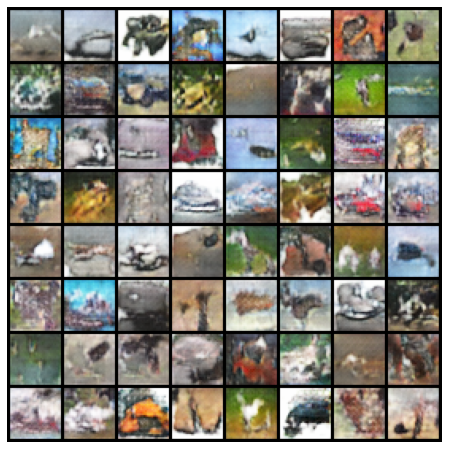

In [40]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

## Plotting the losses over the iteration steps.

### Different parameters gave similar looking graphs for losses with generative loss most likely decreasing in the beginning and then starts increasing again.

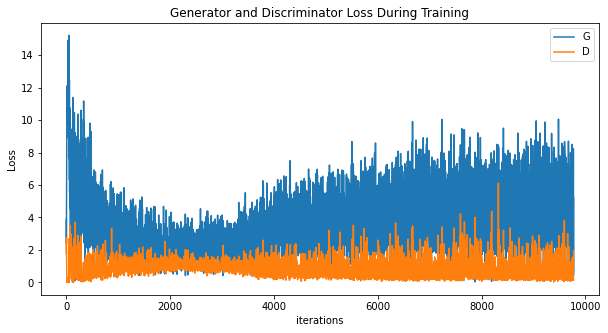

In [41]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()


## Some more images showing the difference between Real and Fake Images.

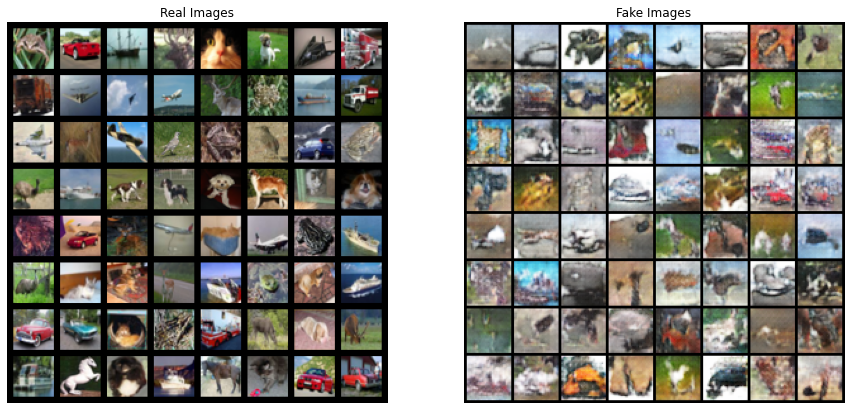

In [42]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(train_loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

## Counting the model parameters.

In [43]:
def count_model_params(model):
    """ Counting the number of learnable parameters in a nn.Module """
    num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return num_params

In [44]:
print("Generator parameter count: ",count_model_params(netG))
print("Discriminator parameter count: ",count_model_params(netD))

Generator parameter count:  2074656
Discriminator parameter count:  693216


# END of File